In [1]:
from jetstream_hugo.jet_finding import *
from jetstream_hugo.definitions import *
from jetstream_hugo.plots import *
from jetstream_hugo.clustering import *
from jetstream_hugo.data import *
import colormaps

%load_ext autoreload
%autoreload 2
%matplotlib inline

ERROR 1: PROJ: proj_create_from_database: Open of /storage/homefs/hb22g102/mambaforge/envs/env11/share/proj failed


In [2]:
exp = MultiVarExperiment(
    "ERA5", "plev", ["u", "v", "s"], "6H", (1940, 2022), None, -80, 30, 20, 80, [200, 250, 300]
)
ds = exp.ds
all_jets, where_are_jets, all_jets_one_array, all_jets_over_time, flags = exp.track_jets()
props_as_ds_uncat = exp.props_as_ds(False)
props_as_ds = exp.props_as_ds(True)
props_as_ds["nao"] = get_nao(interp_like=props_as_ds)
exp_T = Experiment(
    "ERA5", "surf", "t", "6H", (1959, 2022), "JJA", -30, 40, 30, 75, 100, 'hourofyear', {'hourofyear': ('win', 4 * 15)}, None,
)
da_T = exp_T.da
exp_pvs = Experiment(
    "ERA5", "surf", "pvs", "6H", (1959, 2022), "JJA", -80, 30, 20, 80, 250, 'hourofyear', {'hourofyear': ('win', 4 * 15)}, None,
)
da_pvs = exp_pvs.da
exp_z = Experiment(
    "ERA5", "plev", "z", "6H", (1959, 2022), "JJA", -80, 30, 20, 80, 500, 'hourofyear', {'hourofyear': ('win', 4 * 15)}, None,
)
da_z = exp_z.da
time_mask = (props_as_ds.time.dt.season=="JJA") & (props_as_ds.time.dt.year>=1959)
da_jet_pos = jet_position_as_da(ds["s"], props_as_ds, props_as_ds_uncat, all_jets, exp.path).sel(time=time_mask)
ds_late = flatten_by(ds.sel(time=time_mask), "s")
subset = ["mean_lon", "mean_lat", "mean_lev", "width", "persistence", "int"]
props_as_np = props_as_ds[subset].sel(time=time_mask).to_dataarray().values
props_as_np = props_as_np.transpose(1, 0, 2).reshape(props_as_np.shape[1], props_as_np.shape[0] * props_as_np.shape[2]) 

In [41]:
from itertools import product
quantiles = np.nanquantile(props_as_np, q=[.05, .95], axis=0)
props_as_np_digitized = np.zeros_like(props_as_np, dtype=int)
for i, prop_as_np in enumerate(props_as_np.T):
    ouais = np.digitize(prop_as_np, quantiles[:, i])
    props_as_np_digitized[:, i] = np.digitize(prop_as_np, quantiles[:, i], right=True)
titles = [', '.join(ouais) for ouais in product(subset, props_as_ds.jet.values, ['bottom 5%', 'top 5%'])]

ncat = len(quantiles) + 1
unique_labels = np.arange(ncat)
mask_extremes = []
for i, prop_as_np in enumerate(props_as_np_digitized.T):
    masks = prop_as_np[:, None] == unique_labels[None, [0, -1]]
    mask_extremes.append(masks)
mask_extremes = np.concatenate(mask_extremes, axis=1)

## Temperature anomalies

100%|██████████| 24/24 [00:02<00:00,  8.76it/s]


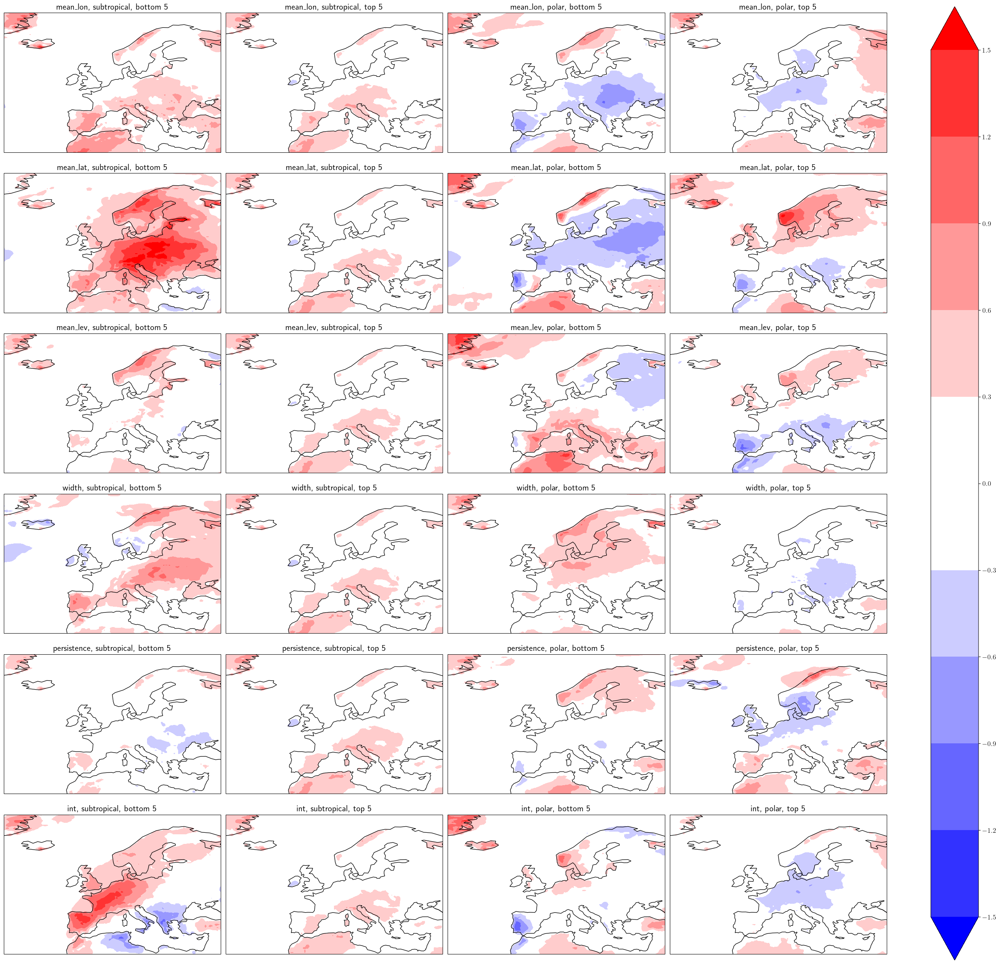

In [42]:
clu = Clusterplot(len(subset), 4, region=get_region(da_T))
_ = clu.add_any_contour_from_mask(da_T, mask_extremes, stippling=False, cmap='bwr', transparify=1, draw_cbar=True, titles=titles, q=0.999, nlevels=6)
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_temp.png')

## Jet position

100%|██████████| 24/24 [00:05<00:00,  4.23it/s]


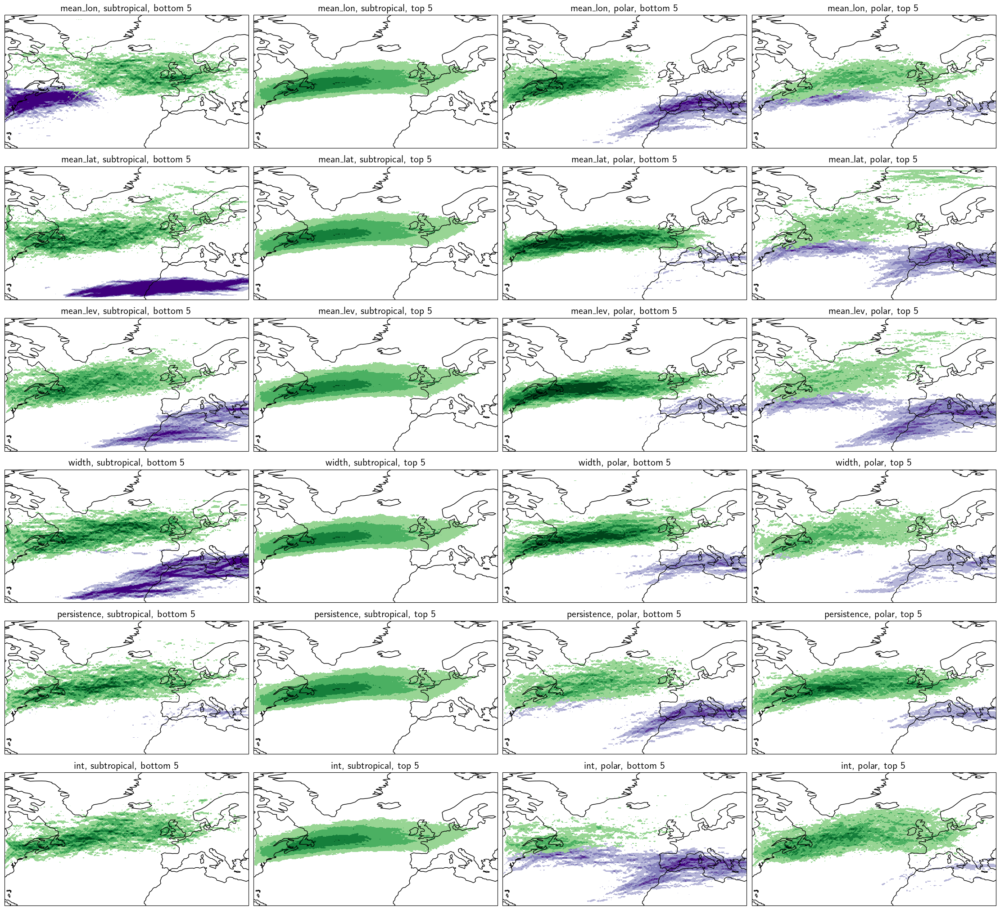

In [43]:
clu = Clusterplot(len(subset), 4, region=get_region(ds))
# _ = clu.add_any_contour_from_mask(da_T, mask_extremes, type='contour', cmap='bwr', clabels=True, nlevels=3, titles=titles)
# clu.resize_relative([0.85, 0.95])
_ = clu.add_any_contour_from_mask(da_jet_pos[:, 0], mask_extremes, stippling=False, cmap='Purples', transparify=2, draw_cbar=False, q=0.98, titles=titles)
_ = clu.add_any_contour_from_mask(da_jet_pos[:, 1], mask_extremes, stippling=False, cmap='Greens', transparify=2, draw_cbar=False, q=0.98)
clu.resize_relative([0.85, 0.95])
plt.savefig('/storage/homefs/hb22g102/persistent-extremes-era5/Figures/jet_index_extremes_composites/jet_index_vs_jet_pos.png')

## Anticyclonic streamers

100%|██████████| 24/24 [00:10<00:00,  2.39it/s]


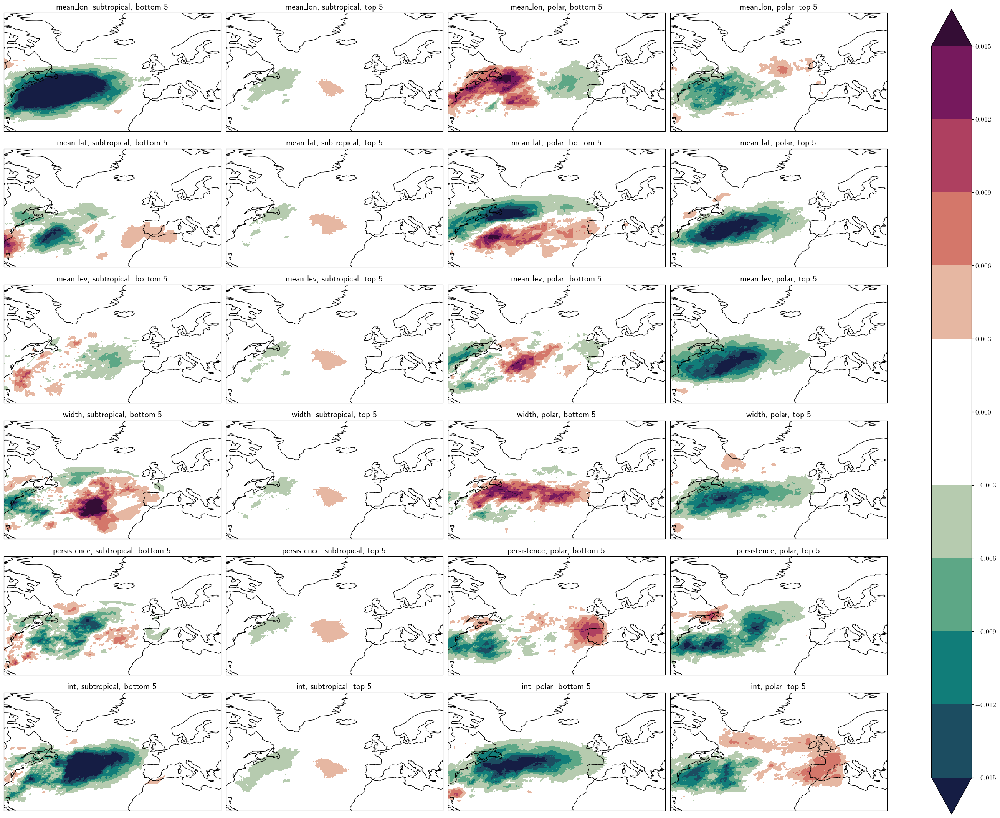

In [46]:
import warnings
clu = Clusterplot(len(subset), 4, region=get_region(da_pvs))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(da_pvs.sel(type="anti"), mask_extremes, stippling=False, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/jet_index_vs_apvs.png')

## Cyclonic streamers

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:10<00:00,  2.40it/s]


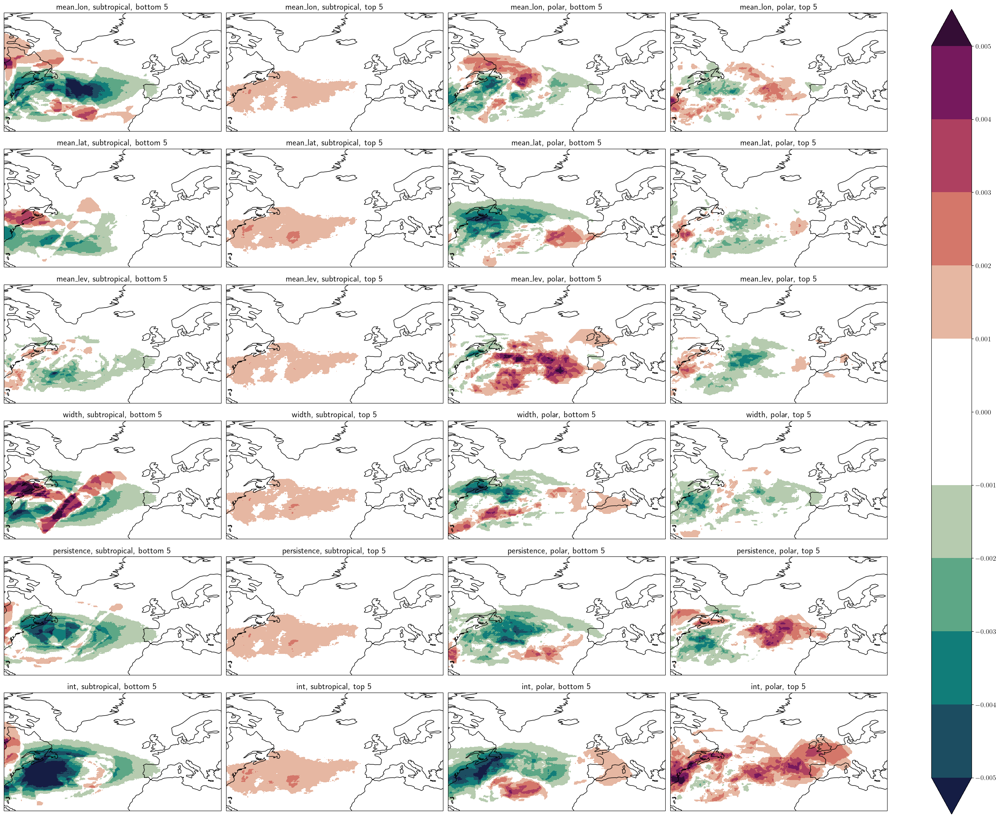

In [47]:
clu = Clusterplot(len(subset), 4, region=get_region(da_pvs))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    _ = clu.add_any_contour_from_mask(da_pvs.sel(type="cycl"), mask_extremes, stippling=False, cmap=colormaps.curl, transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/cpvs.png')

100%|██████████| 24/24 [00:06<00:00,  3.96it/s]


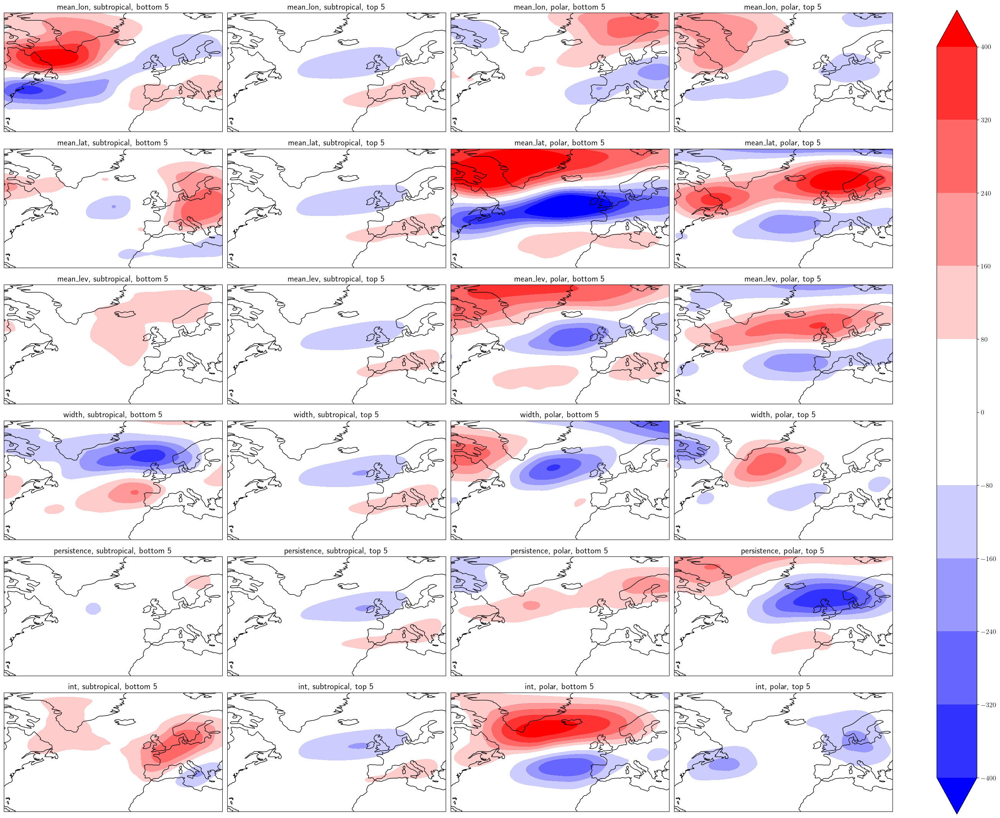

In [48]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(da_z, mask_extremes, stippling=False, cmap="bwr", transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/z.png')

# Wind components

## $u$

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [01:39<00:00,  4.17s/it]


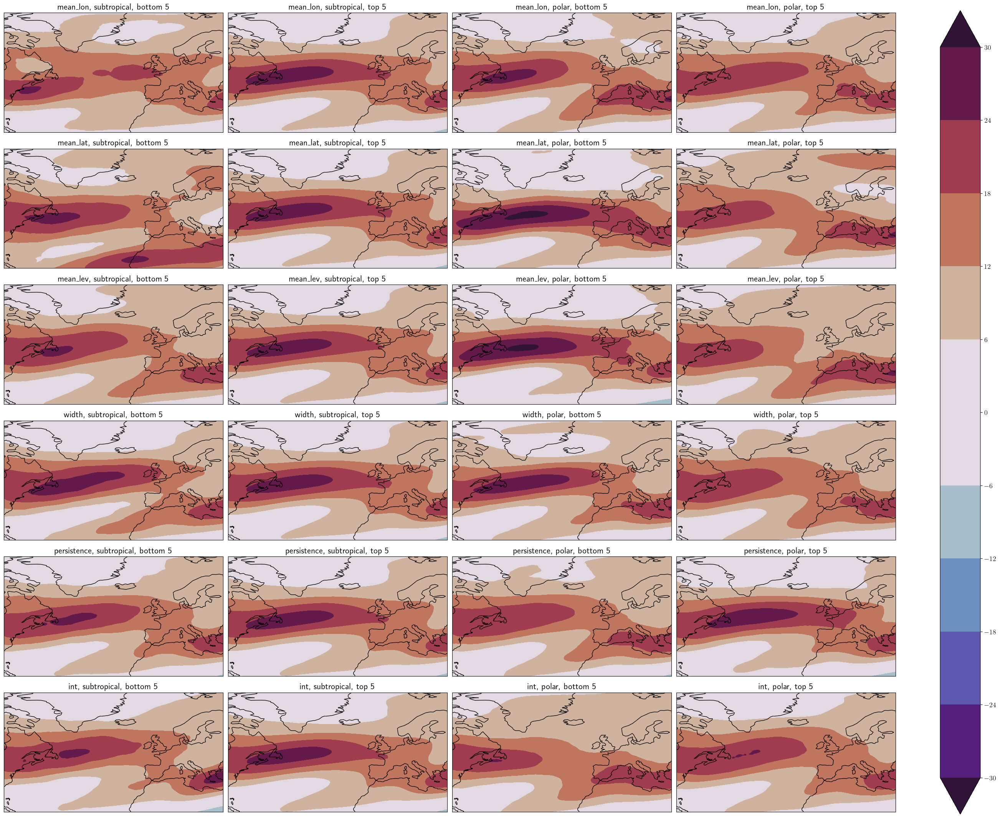

In [49]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(ds_late["u"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=0, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/u.png')

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [01:36<00:00,  4.03s/it]


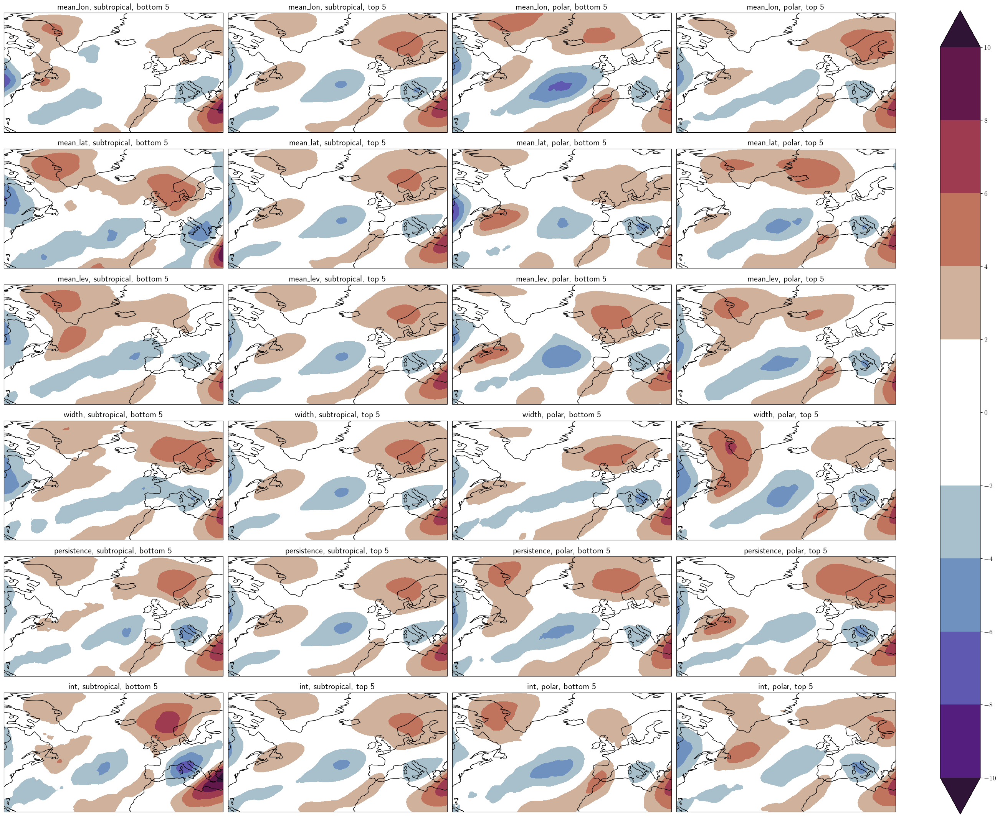

In [50]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(ds_late["v"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=1, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/v.png')

  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [01:32<00:00,  3.85s/it]


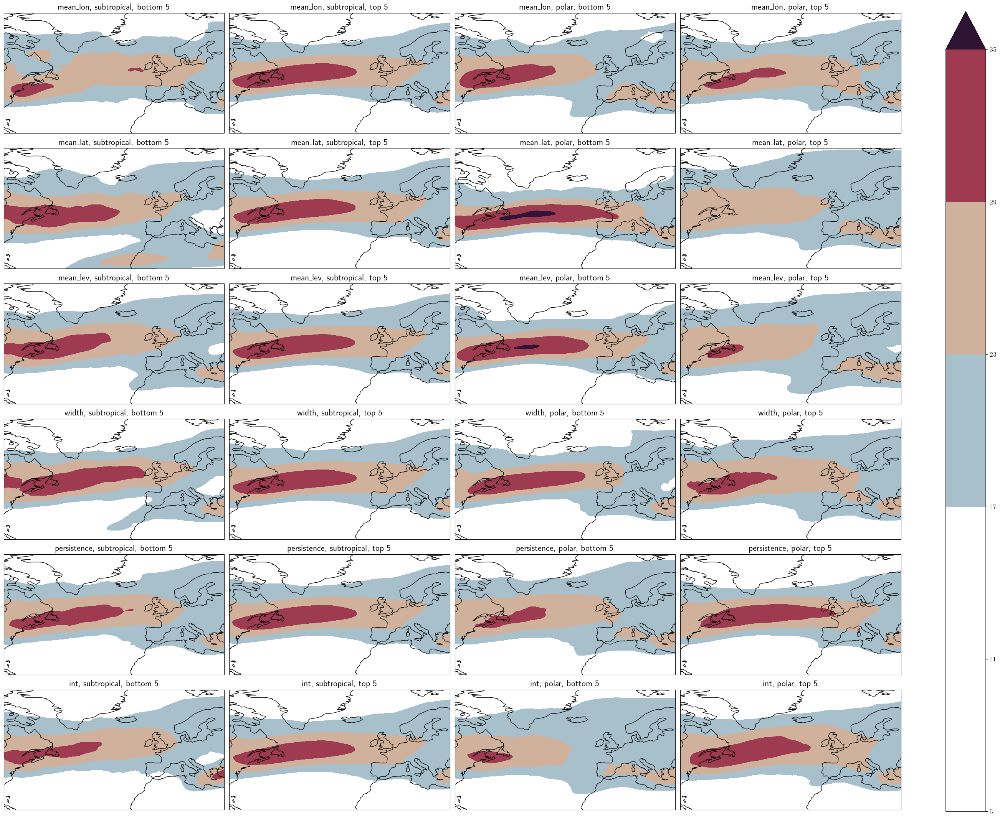

In [51]:
clu = Clusterplot(len(subset), 4, region=get_region(da_z))
_ = clu.add_any_contour_from_mask(ds_late["s"], mask_extremes, stippling=False, cmap="twilight_shifted", transparify=2, draw_cbar=True, titles=titles, q=0.99, nlevels=6)
plt.savefig(f'{FIGURES}/jet_index_extremes_composites/s.png')